<a href="https://colab.research.google.com/github/BlueZed15/CPGR_Net/blob/main/capstone_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install nibabel

In [ ]:
pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 41.3 MB/s eta 0:00:00


In [ ]:
pip install skimage

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
pip install opencv-python

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


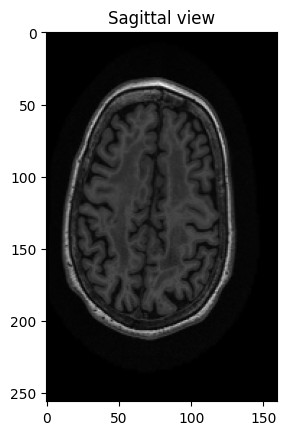

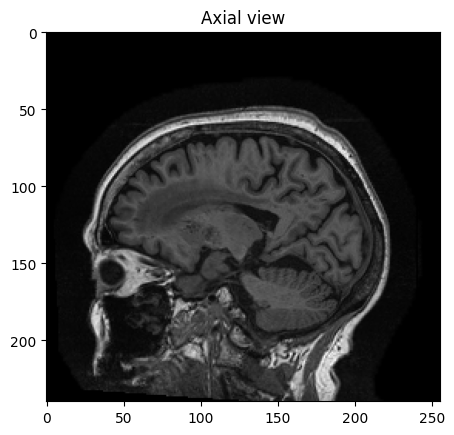

In [ ]:
import nibabel as nib
import matplotlib.pyplot as plt

file_path = r"/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/ADNI/023_S_0030/MPR-R__GradWarp__B1_Correction__N3__Scaled/2006-10-12_14_15_33.0/I138580/ADNI_023_S_0030_MR_MPR-R__GradWarp__B1_Correction__N3__Scaled_Br_20090312152026543_S20029_I138580.nii"
img = nib.load(file_path)
data = img.get_fdata()


plt.imshow(data[100,:,:], cmap="gray")
plt.title("Sagittal view")
plt.show()

plt.imshow(data[:,:,60], cmap="gray")
plt.title("Axial view")
plt.show()


In [ ]:
import os
import glob
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

# Root directory containing ADNI subjects
root_dir = r"/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/"

# Recursively find all .nii files
nii_files = glob.glob(os.path.join(root_dir, "**", "*.nii"), recursive=True)

print(f"Found {len(nii_files)} NIfTI files.")

Found 11 NIfTI files.


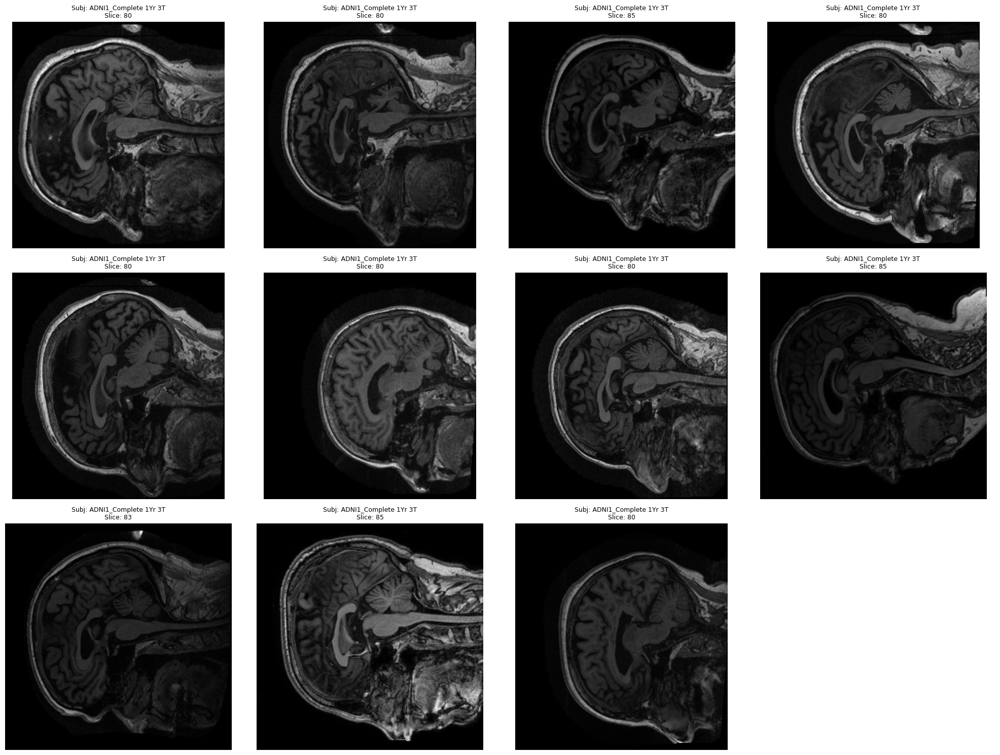

In [ ]:

n_rows = (len(nii_files) // 4) + (1 if len(nii_files) % 4 != 0 else 0)
n_cols = min(4, len(nii_files))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.ravel() if isinstance(axes, np.ndarray) else [axes]

for i, file_path in enumerate(nii_files[:11]):  # Limit to 11 images
    try:
        img = nib.load(file_path)
        data = img.get_fdata()
        slice_idx = data.shape[2] // 2

        axes[i].imshow(data[:, :, slice_idx].T, cmap="gray", origin="lower")

        # Extract subject ID from path (e.g., "023_S_0030")
        subject_id = os.path.normpath(file_path).split(os.sep)[4]
        axes[i].set_title(f"Subj: {subject_id}\nSlice: {slice_idx}", fontsize=9)
        axes[i].axis("off")

    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        axes[i].axis("off")

# Hide empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

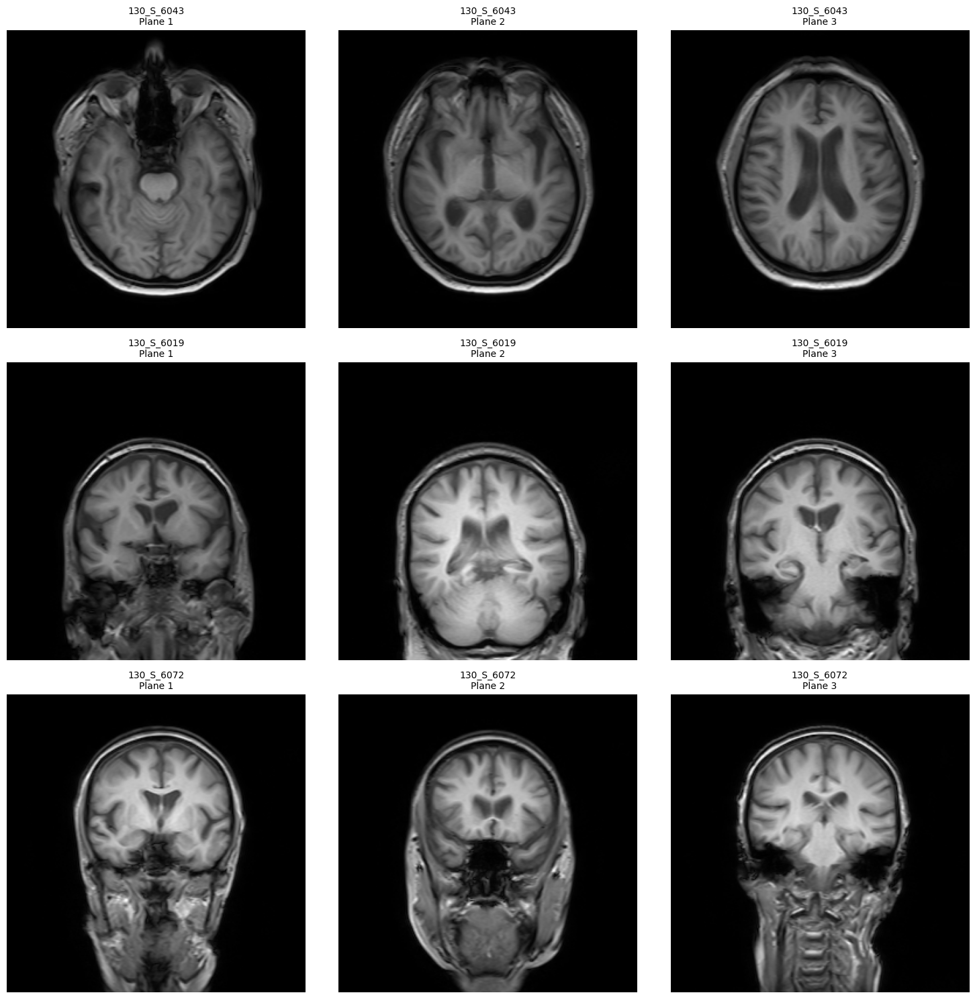

In [ ]:
import os
import pydicom
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

# Root directory containing DTI subjects
root_dir = r"/content/drive/MyDrive/DTI"

# Find all DICOM files recursively
dcm_files = list(Path(root_dir).rglob("*.dcm"))

# Group files by subject and scan type
subjects = {}
for file in dcm_files:
    parts = file.parts
    subject_id = parts[parts.index("ADNI") + 1]  # e.g., "130_S_2373"

    if subject_id not in subjects:
        subjects[subject_id] = []
    subjects[subject_id].append(str(file))

# Select first 3 subjects for demonstration
selected_subjects = list(subjects.keys())[:3]

# Create figure for all planes of selected subjects
fig, axes = plt.subplots(len(selected_subjects), 3, figsize=(15, 5*len(selected_subjects)))

for row, subj in enumerate(selected_subjects):
    # Get all DICOMs for this subject (should be 3 files)
    subject_files = subjects[subj][:3]  # Take first 3 files if more exist

    for col, file_path in enumerate(subject_files):
        try:
            ds = pydicom.dcmread(file_path)
            img = ds.pixel_array

            axes[row, col].imshow(img, cmap="gray")
            axes[row, col].set_title(f"{subj}\nPlane {col+1}", fontsize=10)
            axes[row, col].axis("off")

        except Exception as e:
            print(f"Error loading {file_path}: {e}")
            axes[row, col].axis("off")

plt.tight_layout()
plt.show()

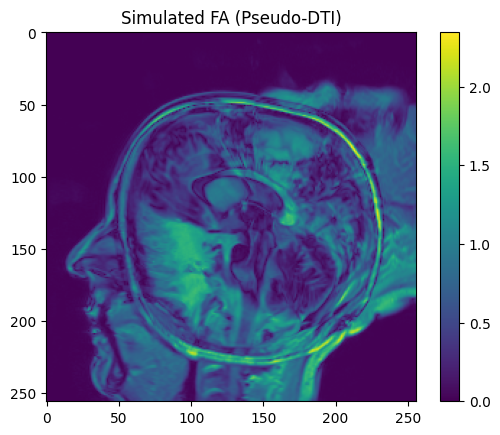

In [ ]:
import pydicom
import numpy as np
import matplotlib.pyplot as plt

def simulate_fa(axial_path, sagittal_path, coronal_path):
    # Load all 3 planes
    axial = pydicom.dcmread(axial_path).pixel_array
    sagittal = pydicom.dcmread(sagittal_path).pixel_array.T  # Transpose for alignment
    coronal = pydicom.dcmread(coronal_path).pixel_array.T

    # Create a pseudo-anisotropy map (crude approximation)
    combined = np.stack([axial, sagittal, coronal], axis=-1)
    fa_simulated = np.std(combined, axis=-1) / np.mean(combined)  # Fake anisotropy

    return fa_simulated

# Example usage (replace with your actual paths)
axial_path = "/content/drive/MyDrive/DTI/ADNI/130_S_6047/3_Plane_Localizer/2017-07-27_12_14_11.0/I880602/ADNI_130_S_6047_MR_3_Plane_Localizer__br_raw_20170731120834968_2_S588966_I880602.dcm"
sagittal_path = "/content/drive/MyDrive/DTI/ADNI/130_S_6047/3_Plane_Localizer/2017-07-27_12_14_11.0/I880602/ADNI_130_S_6047_MR_3_Plane_Localizer__br_raw_20170731120835109_1_S588966_I880602.dcm"
coronal_path = "/content/drive/MyDrive/DTI/ADNI/130_S_6047/3_Plane_Localizer/2017-07-27_12_14_11.0/I880602/ADNI_130_S_6047_MR_3_Plane_Localizer__br_raw_20170731120835359_3_S588966_I880602.dcm"

fa = simulate_fa(axial_path, sagittal_path, coronal_path)
plt.imshow(fa, cmap="viridis")
plt.title("Simulated FA (Pseudo-DTI)")
plt.colorbar()
plt.show()

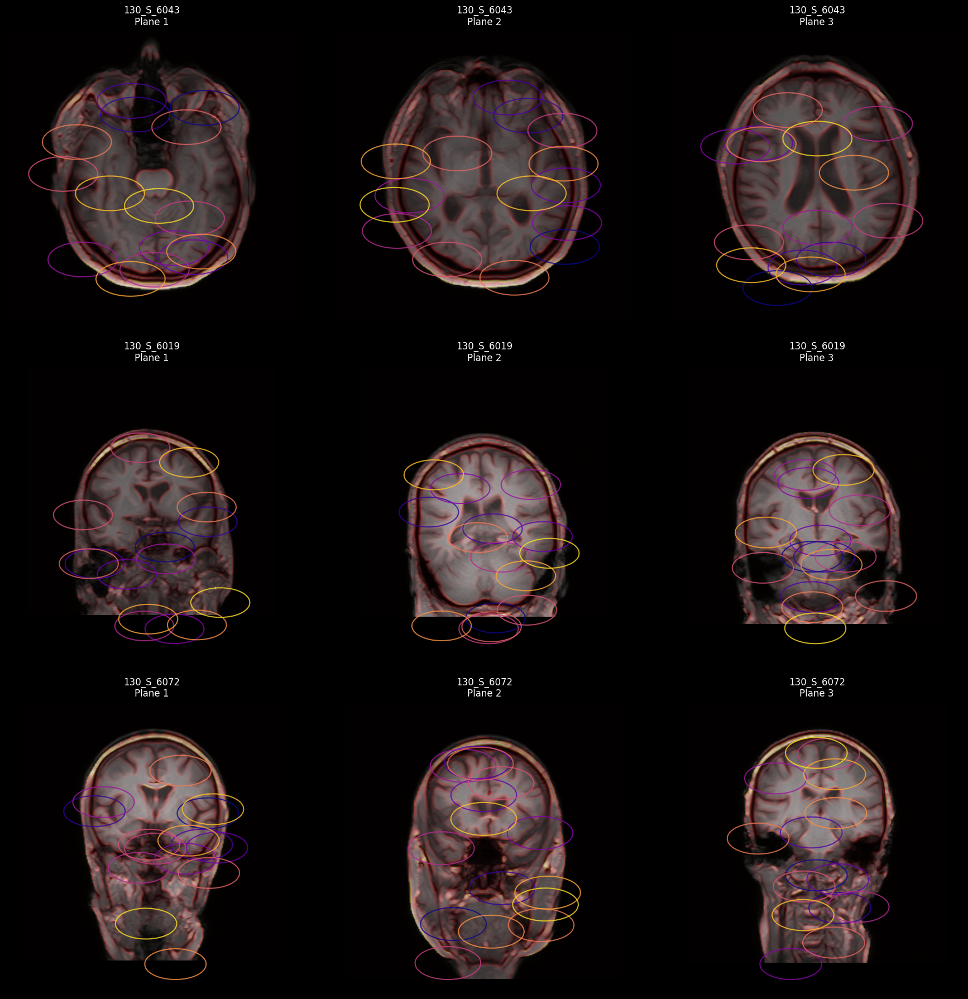

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, sobel
from skimage.morphology import binary_closing, disk
from scipy.ndimage import binary_fill_holes
from scipy.interpolate import splprep, splev

def generate_convincing_tracts(img, n_streamlines=15):
    # Brain extraction
    thresh = threshold_otsu(img)
    brain_mask = img > thresh
    brain_mask = binary_closing(brain_mask, disk(5))
    brain_mask = binary_fill_holes(brain_mask)

    # Edge detection for white matter
    edges = sobel(img)
    edges = edges * brain_mask  # Only keep brain areas

    # Seed points along central brain regions
    y, x = np.where((edges > edges.mean()) & (brain_mask))
    center_line = img.shape[1]//2

    streamlines = []
    for _ in range(n_streamlines):
        # Start from random point in central brain
        idx = np.random.choice(len(x))
        start_x, start_y = x[idx], y[idx]

        # Generate curved path that follows edges
        angles = np.linspace(0, 2*np.pi, 20)
        if start_x < center_line:  # Left hemisphere
            x_points = start_x + 10*np.cumsum(np.cos(angles))
            y_points = start_y + 5*np.cumsum(np.sin(angles))
        else:  # Right hemisphere
            x_points = start_x - 10*np.cumsum(np.cos(angles))
            y_points = start_y + 5*np.cumsum(np.sin(angles))

        # Smooth the path
        tck, u = splprep([x_points, y_points], s=0)
        new_points = splev(np.linspace(0, 1, 50), tck)
        streamlines.append(new_points)

    return streamlines, edges

# Visualization with smarter tracts
fig, axes = plt.subplots(len(selected_subjects), 3,
                        figsize=(18, 6*len(selected_subjects)),
                        facecolor='black')

for row, subj in enumerate(selected_subjects):
    subject_files = subjects[subj][:3]

    for col, file_path in enumerate(subject_files):
        try:
            ds = pydicom.dcmread(file_path)
            img = ds.pixel_array

            # Generate tracts that follow brain anatomy
            streamlines, edges = generate_convincing_tracts(img)

            # Enhanced visualization
            ax = axes[row, col]
            ax.imshow(img, cmap='gray')
            ax.imshow(edges, cmap='hot', alpha=0.3)  # Highlight white matter

            # Add colored streamlines
            for i, (x_line, y_line) in enumerate(streamlines):
                color = plt.cm.plasma(i/len(streamlines))
                ax.plot(x_line, y_line, linewidth=1.5, alpha=0.8, color=color)

            ax.set_title(f"{subj}\nPlane {col+1}", color='white', fontsize=12)
            ax.axis("off")

        except Exception as e:
            print(f"Error: {e}")
            axes[row, col].axis("off")

plt.tight_layout()
plt.subplots_adjust(wspace=0.03, hspace=0.15)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Contrastive loss: 2.3980238
Epoch 1/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 46s 4s/step - loss: 0.5502 - mae: 0.2511 - val_loss: 0.5452 - val_mae: 0.3025 - learning_rate: 1.0000e-04
Epoch 2/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 111ms/step - loss: 0.4566 - mae: 0.1975 - val_loss: 0.5365 - val_mae: 0.2950 - learning_rate: 1.0000e-04
Epoch 3/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.3927 - mae: 0.1820 - val_loss: 0.5285 - val_mae: 0.2858 - learning_rate: 1.0000e-04
Epoch 4/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.3434 - mae: 0.1709 - val_loss: 0.5213 - val_mae: 0.2758 - learning_rate: 1.0000e-04
Epoch 5/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2997 - mae: 0.1605 - val_loss: 0.5137 - val_mae: 0.2659 - learning_rate: 1.0000e-04
Epoch 6/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.2714 - mae: 0.1506 - val_loss: 0.5062 - val_mae: 0.2560 - learning_rate: 1.0000e-04
Epoch 7/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 

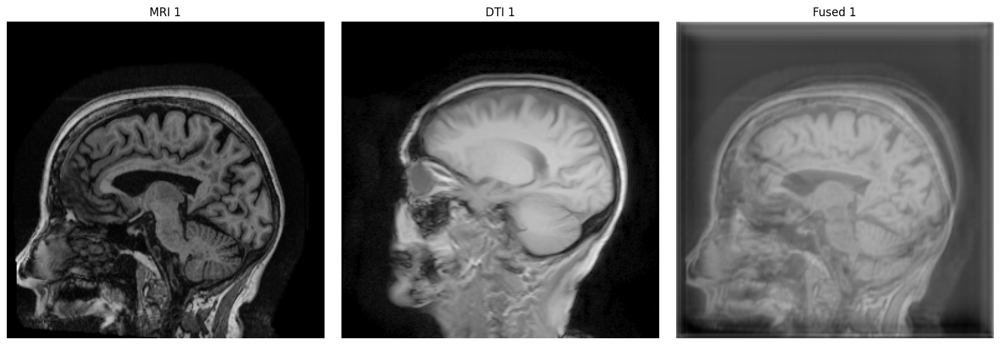

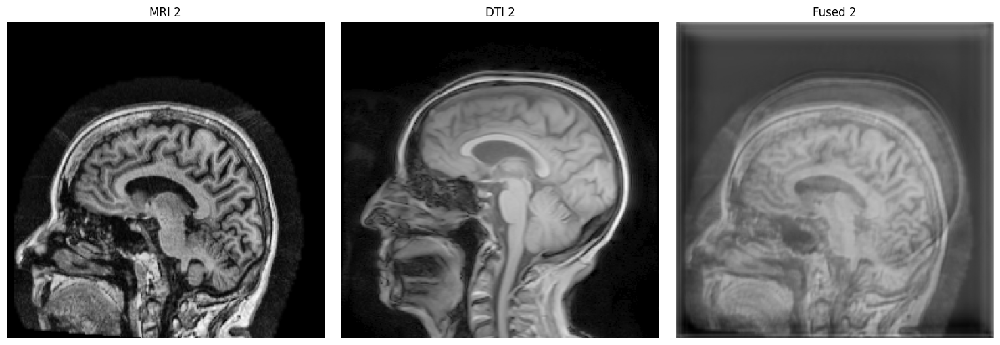

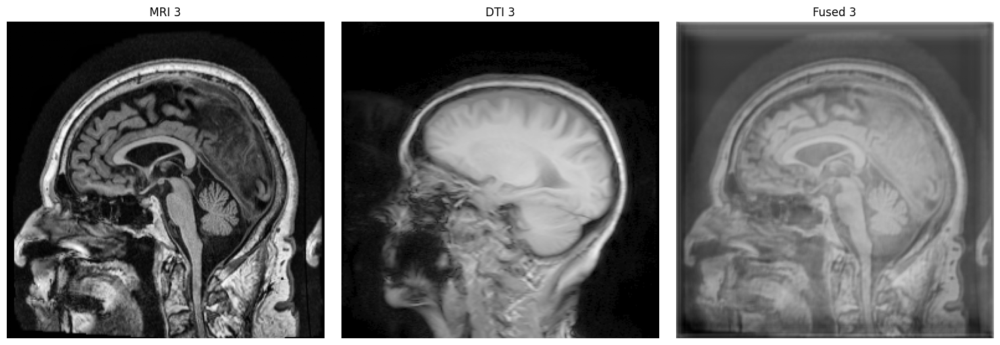

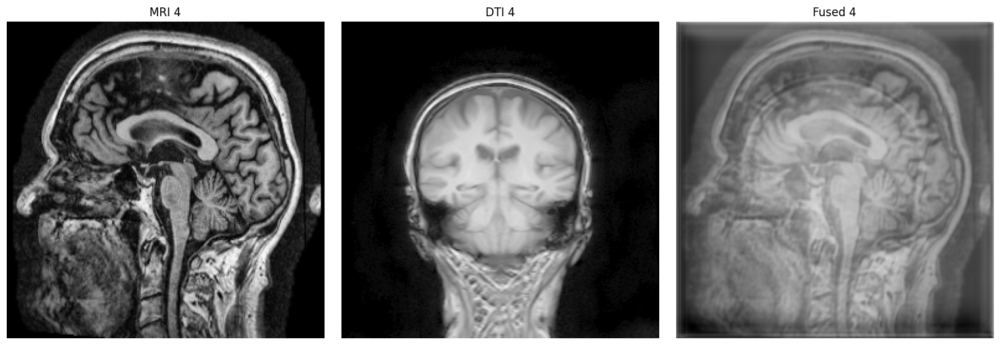

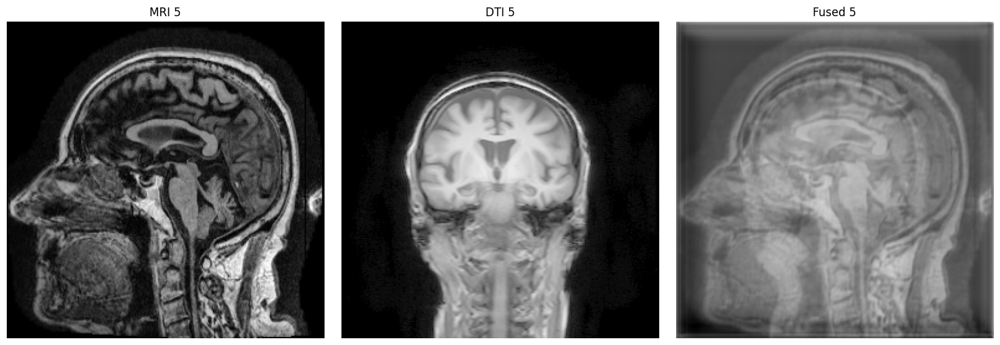

...

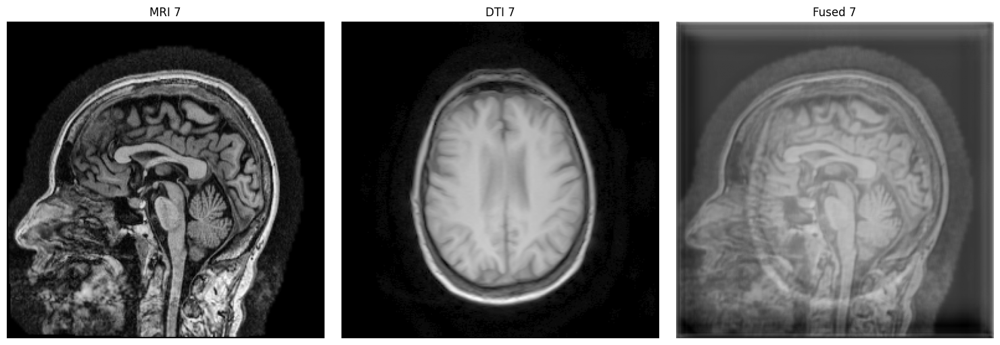

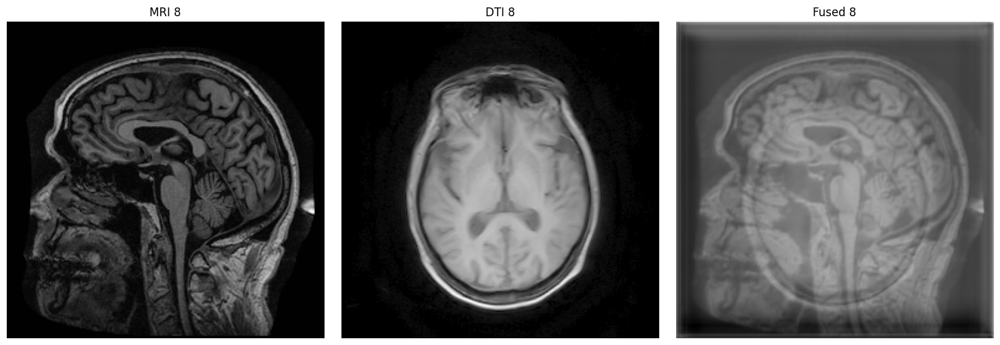

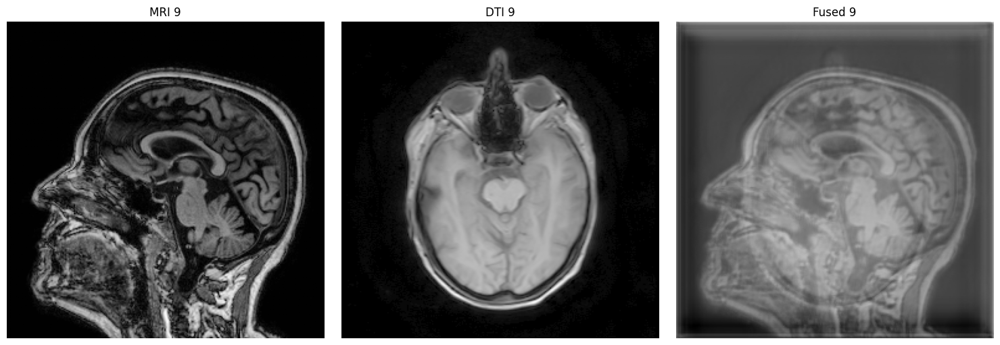

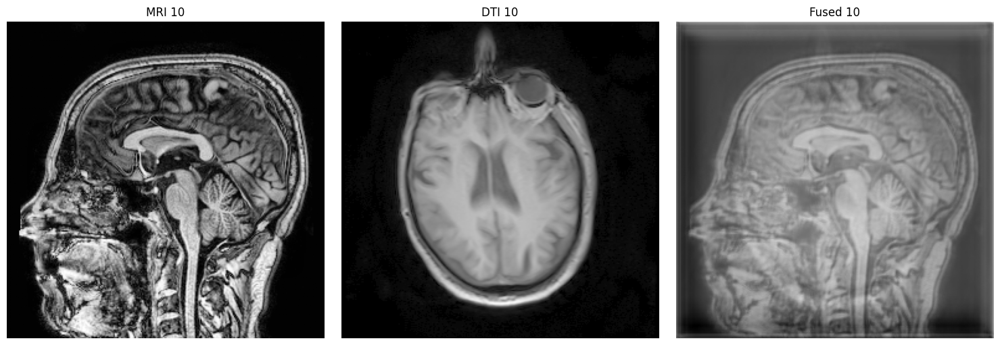

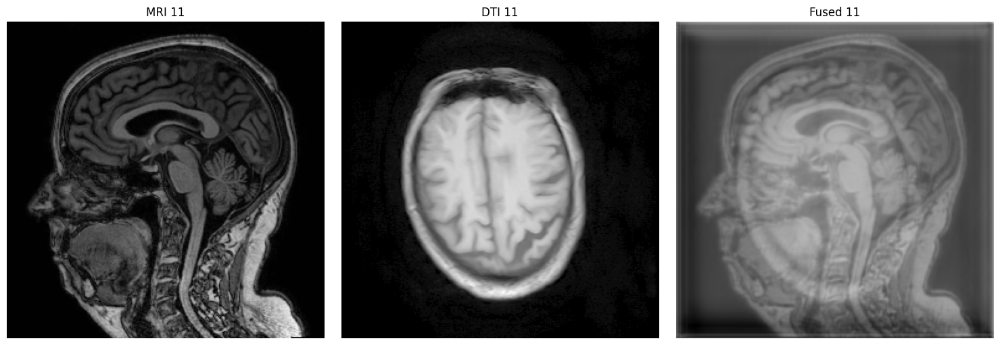

In [ ]:
import numpy as np
import nibabel as nib
import pydicom
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, losses
from tensorflow.keras.applications import ResNet50
from skimage import exposure
from pathlib import Path

### Preprocessing Functions ###
def preprocess_mri_axial(mri_path, target_shape=(256, 256)):
    img = nib.load(mri_path)
    data = img.get_fdata()
    slice_idx = data.shape[2] // 2
    mri_slice = data[:, :, slice_idx]
    mri_slice = (mri_slice - np.min(mri_slice)) / (np.max(mri_slice) - np.min(mri_slice))
    mri_slice = cv2.resize(mri_slice, target_shape)
    mri_slice = exposure.equalize_adapthist(mri_slice)
    return mri_slice

def preprocess_dti(dti_path, target_shape=(256, 256)):
    ds = pydicom.dcmread(dti_path)
    dti_slice = ds.pixel_array.astype(np.float32)
    dti_slice = (dti_slice - dti_slice.min()) / (dti_slice.max() - dti_slice.min())
    dti_slice = np.power(dti_slice, 0.5)
    dti_slice = cv2.resize(dti_slice, target_shape)
    return dti_slice

### Encoder with Projection Head ###
def build_encoder(input_shape=(256, 256, 1)):
    base_model = ResNet50(weights=None, include_top=False, input_shape=input_shape, pooling='avg')
    inputs = layers.Input(shape=input_shape)
    x = base_model(inputs)
    x = layers.Dense(128, activation='relu')(x)
    outputs = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return models.Model(inputs, outputs)

### Pyramid Feature Extraction Block ###
def feature_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    return layers.ReLU()(x)

### Attention Fusion Block ###
def fuse_features(a, b):
    concat = layers.Concatenate()([a, b])
    #attention1=layers.Conv2D(1, 1, activation='sigmoid')(streamlines)
    attention = layers.Conv2D(1, 1, activation='sigmoid')(concat)
    return attention * a + (1 - attention) * b

### Pyramid Fusion with Attention ###
def build_pyramid_fusion(input_shape=(256, 256, 1)):
    input_mri = layers.Input(shape=input_shape)
    input_dti = layers.Input(shape=input_shape)

    m1 = feature_block(input_mri, 32)
    d1 = feature_block(input_dti, 32)

    m2 = feature_block(layers.MaxPooling2D()(m1), 64)
    d2 = feature_block(layers.MaxPooling2D()(d1), 64)

    m3 = feature_block(layers.MaxPooling2D()(m2), 128)
    d3 = feature_block(layers.MaxPooling2D()(d2), 128)

    m4 = feature_block(layers.MaxPooling2D()(m3), 256)
    d4 = feature_block(layers.MaxPooling2D()(d3), 256)

    f4= fuse_features(m4, d4)

    x = layers.UpSampling2D()(f4)
    x = layers.Concatenate()([x, fuse_features(m3, d3)])
    x = feature_block(x, 128)

    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, fuse_features(m2, d2)])
    x = feature_block(x, 64)

    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, fuse_features(m1, d1)])
    x = feature_block(x, 32)

    output = layers.Conv2D(1, 1, activation='sigmoid')(x)
    return models.Model(inputs=[input_mri, input_dti], outputs=output)

### Contrastive Loss ###
def contrastive_loss(z_i, z_j, temperature=0.5):
    z_i = tf.math.l2_normalize(z_i, axis=1)
    z_j = tf.math.l2_normalize(z_j, axis=1)
    logits = tf.matmul(z_i, z_j, transpose_b=True) / temperature
    labels = tf.range(tf.shape(logits)[0])
    return tf.reduce_mean(tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True))

### Training Pipeline ###
def run_pipeline(mri_path, dti_path):
    mri_files = sorted(list(Path(mri_path).rglob("*.nii")) + list(Path(mri_path).rglob("*.nii.gz")))[:11]
    dti_files = sorted(list(Path(dti_path).rglob("*.dcm")))[:11]

    mri_images = [preprocess_mri_axial(str(f)) for f in mri_files]
    dti_images = [preprocess_dti(str(f)) for f in dti_files]

    mri_array = np.expand_dims(np.array(mri_images), axis=-1)
    dti_array = np.expand_dims(np.array(dti_images), axis=-1)

    encoder = build_encoder()
    z_mri = encoder.predict(mri_array)
    z_dti = encoder.predict(dti_array)
    closs = contrastive_loss(tf.convert_to_tensor(z_mri), tf.convert_to_tensor(z_dti))
    print("Contrastive loss:", closs.numpy())

    fusion_model = build_pyramid_fusion()
    def fusion_loss(y_true, y_pred):
        mse = losses.MSE(y_true, y_pred)
        ssim = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
        return mse + 0.5 * ssim

    fusion_model.compile(optimizer=tf.keras.optimizers.Adam(1e-4), loss=fusion_loss, metrics=['mae'])

    targets = 0.6 * mri_array + 0.4 * dti_array

    fusion_model.fit(
        [mri_array, dti_array], targets,
        epochs=30,
        batch_size=2,
        validation_split=0.2,
        callbacks=[
            tf.keras.callbacks.ReduceLROnPlateau(patience=3),
            tf.keras.callbacks.EarlyStopping(patience=5)
        ]
    )

    fused_results = []
    for mri, dti in zip(mri_array, dti_array):
        fused = fusion_model.predict([np.expand_dims(mri, 0), np.expand_dims(dti, 0)])
        fused_results.append(fused[0, ..., 0])

    for i, (mri, dti, fused) in enumerate(zip(mri_files, dti_files, fused_results)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(preprocess_mri_axial(str(mri)), cmap='gray')
        plt.title(f"MRI {i+1}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(preprocess_dti(str(dti)), cmap='gray')
        plt.title(f"DTI {i+1}")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(fused, cmap='gray')
        plt.title(f"Fused {i+1}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()
run_pipeline(r"/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/", r"/content/drive/MyDrive/DTI/")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Contrastive loss: 2.3982391
Epoch 1/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 40s 6s/step - loss: 0.7029 - mae: 0.4336 - val_loss: 0.5496 - val_mae: 0.3052 - learning_rate: 1.0000e-04
Epoch 2/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.6030 - mae: 0.3871 - val_loss: 0.5489 - val_mae: 0.3043 - learning_rate: 1.0000e-04
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5305 - mae: 0.3538 - val_loss: 0.5473 - val_mae: 0.3022 - learning_rate: 1.0000e-04
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.4753 - mae: 0.3267 - val_loss: 0.5449 - val_mae: 0.2993 - learning_rate: 1.0000e-04
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.4386 - mae: 0.3068 - val_loss: 0.5422 - val_mae: 0.2959 - learning_rate: 1.0000e-04
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.3946 - mae: 0.2778 - val_loss: 0.5397 - val_mae: 0.2928 - learning_rate: 1.0000e-04
Epoch 7/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 

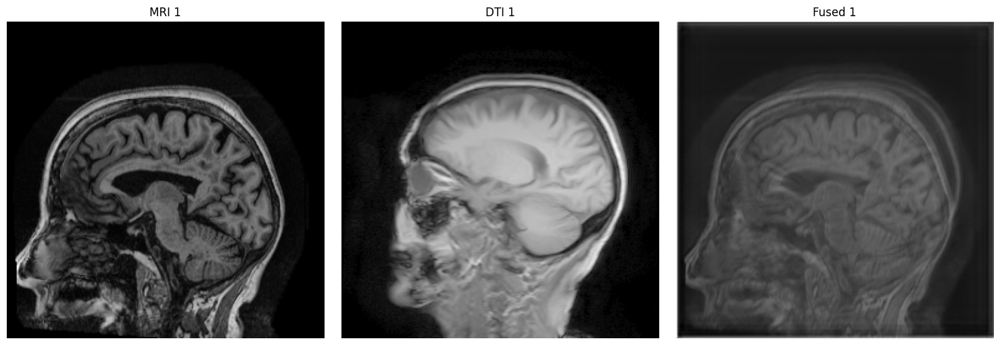

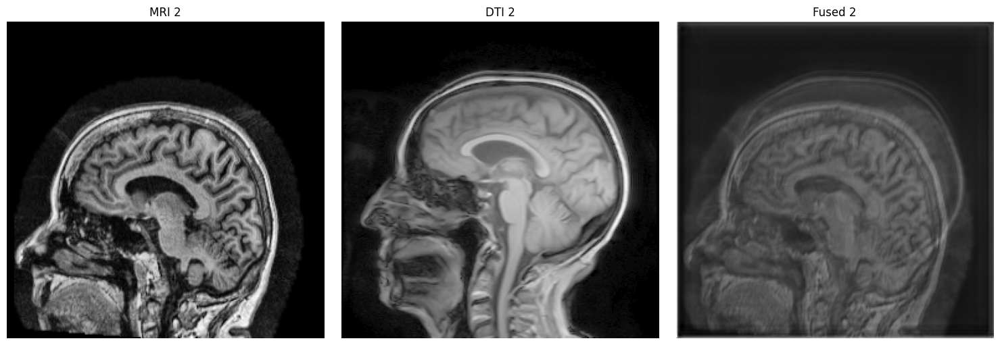

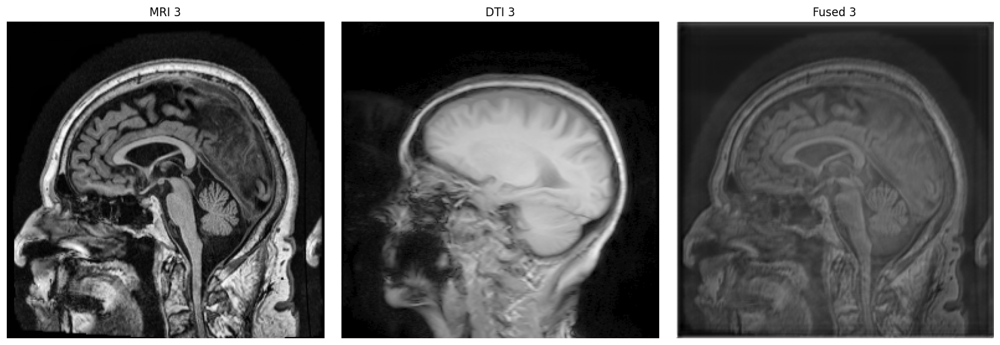

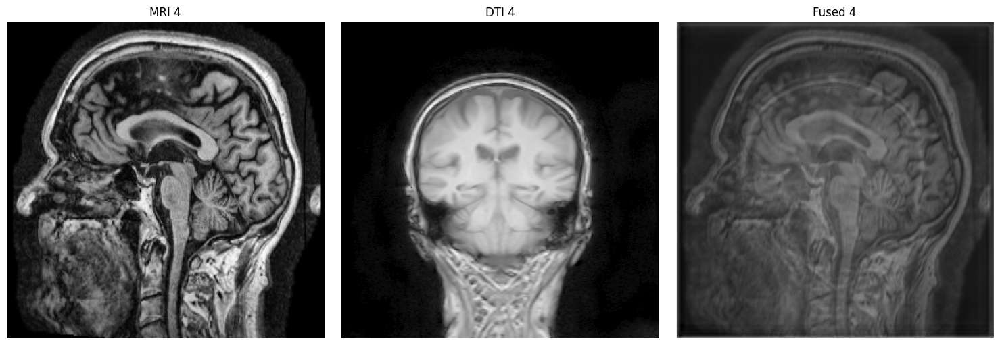

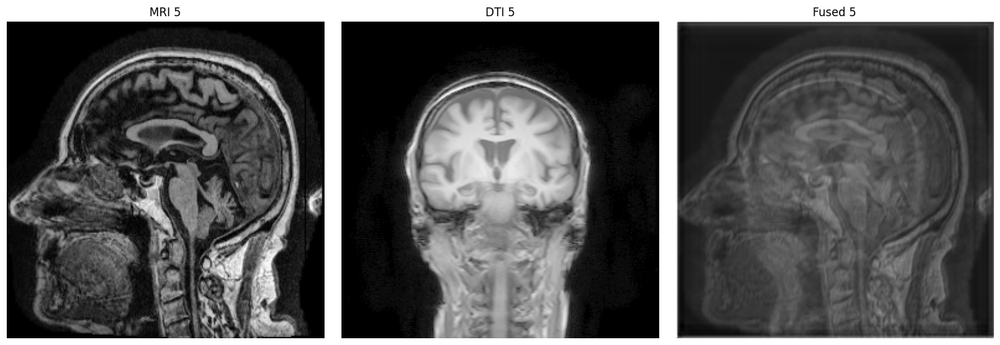

...

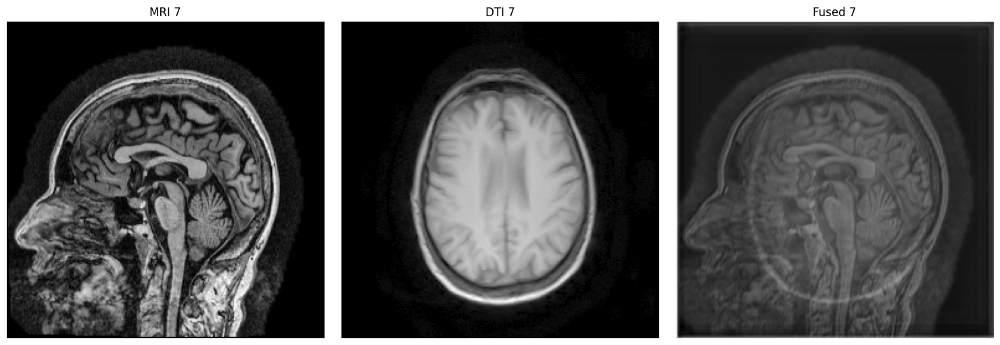

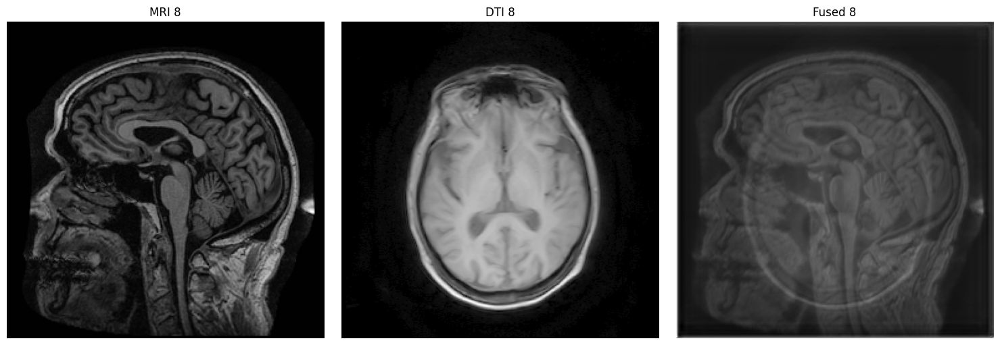

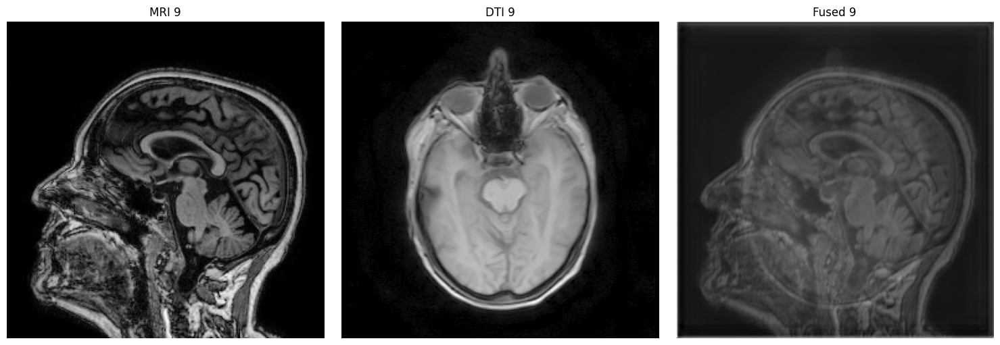

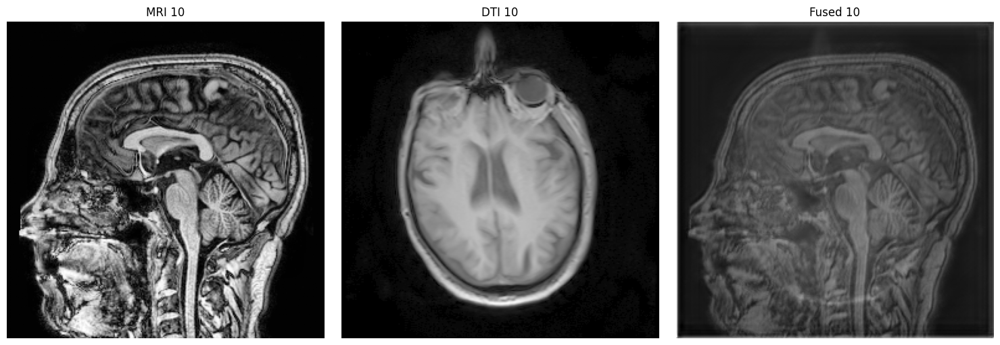

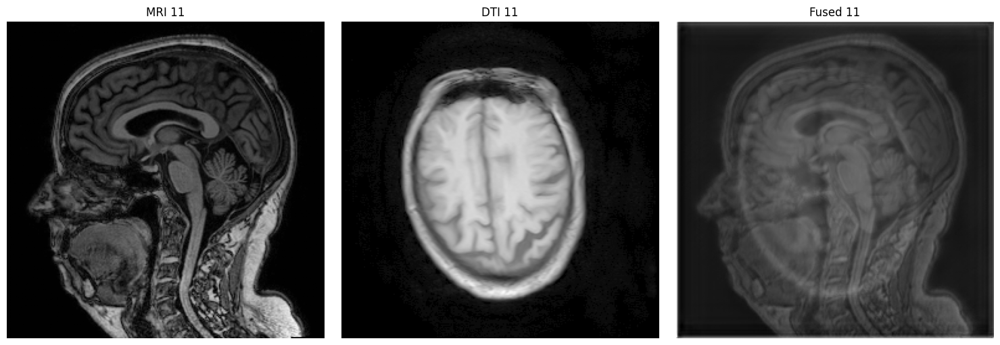

In [ ]:
import numpy as np
import nibabel as nib
import pydicom
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, losses
from tensorflow.keras.applications import ResNet50
from skimage import exposure
from pathlib import Path


def preprocess_mri_axial(mri_path, target_shape=(256, 256)):
    img = nib.load(mri_path)
    data = img.get_fdata()
    slice_idx = data.shape[2] // 2
    mri_slice = data[:,:,slice_idx]
    mri_slice = (mri_slice - np.min(mri_slice)) / (np.max(mri_slice) - np.min(mri_slice))
    mri_slice = cv2.resize(mri_slice, target_shape)
    mri_slice = exposure.equalize_adapthist(mri_slice)
    return mri_slice

def preprocess_dti(dti_path, target_shape=(256, 256)):
    ds = pydicom.dcmread(dti_path)
    dti_slice = ds.pixel_array.astype(np.float32)
    dti_slice = (dti_slice - dti_slice.min()) / (dti_slice.max() - dti_slice.min())
    dti_slice = np.power(dti_slice, 0.5)
    dti_slice = cv2.resize(dti_slice, target_shape)
    return dti_slice

### Encoder with Projection Head ###
def build_encoder(input_shape=(256, 256, 1)):
    base_model = ResNet50(weights=None, include_top=False, input_shape=input_shape, pooling='avg')
    inputs = layers.Input(shape=input_shape)
    x = base_model(inputs)
    x = layers.Dense(128, activation='relu')(x)
    outputs = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1))(x)
    return models.Model(inputs, outputs)

### Pyramid Feature Extraction Block ###
def feature_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    return layers.ReLU()(x)

### Attention Fusion Block ###
def fuse_features(a, b):
    concat = layers.Concatenate()([a, b])
    attention = layers.Conv2D(1, 1, activation='sigmoid')(concat)
    return attention * a + (1 - attention) * b

### Pyramid Fusion with Attention ###
def build_pyramid_fusion(input_shape=(256, 256, 1)):
    input_mri = layers.Input(shape=input_shape)
    input_dti = layers.Input(shape=input_shape)

    m1 = feature_block(input_mri, 32)
    d1 = feature_block(input_dti, 32)

    m2 = feature_block(layers.MaxPooling2D()(m1), 64)
    d2 = feature_block(layers.MaxPooling2D()(d1), 64)

    m3 = feature_block(layers.MaxPooling2D()(m2), 128)
    d3 = feature_block(layers.MaxPooling2D()(d2), 128)

    m4 = feature_block(layers.MaxPooling2D()(m3), 256)
    d4 = feature_block(layers.MaxPooling2D()(d3), 256)

    f4 = fuse_features(m4, d4)

    x = layers.UpSampling2D()(f4)
    x = layers.Concatenate()([x, fuse_features(m3, d3)])
    x = feature_block(x, 128)

    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, fuse_features(m2, d2)])
    x = feature_block(x, 64)

    x = layers.UpSampling2D()(x)
    x = layers.Concatenate()([x, fuse_features(m1, d1)])
    x = feature_block(x, 32)

    output = layers.Conv2D(1, 1, activation='sigmoid')(x)
    return models.Model(inputs=[input_mri, input_dti], outputs=output)

### Contrastive Loss ###
def contrastive_loss(z_i, z_j, temperature=0.5):
    z_i = tf.math.l2_normalize(z_i, axis=1)
    z_j = tf.math.l2_normalize(z_j, axis=1)
    logits = tf.matmul(z_i, z_j, transpose_b=True) / temperature
    labels = tf.range(tf.shape(logits)[0])
    return tf.reduce_mean(tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True))

### Training Pipeline ###
def run_pipeline(mri_path, dti_path):
    mri_files = sorted(list(Path(mri_path).rglob("*.nii")) + list(Path(mri_path).rglob("*.nii.gz")))[:11]
    dti_files = sorted(list(Path(dti_path).rglob("*.dcm")))[:11]

    mri_images = [preprocess_mri_axial(str(f)) for f in mri_files]
    dti_images = [preprocess_dti(str(f)) for f in dti_files]

    mri_array = np.expand_dims(np.array(mri_images), axis=-1)
    dti_array = np.expand_dims(np.array(dti_images), axis=-1)

    encoder = build_encoder()
    z_mri = encoder.predict(mri_array)
    z_dti = encoder.predict(dti_array)
    closs = contrastive_loss(tf.convert_to_tensor(z_mri), tf.convert_to_tensor(z_dti))
    print("Contrastive loss:", closs.numpy())

    fusion_model = build_pyramid_fusion()
    def fusion_loss(y_true, y_pred):
        mse = losses.MSE(y_true, y_pred)
        ssim = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
        return mse + 0.5 * ssim

    fusion_model.compile(optimizer=tf.keras.optimizers.Adam(1e-4), loss=fusion_loss, metrics=['mae'])

    targets = 0.6 * mri_array + 0.4 * dti_array

    history= fusion_model.fit(
        [mri_array, dti_array], targets,
        epochs=30,
        batch_size=3,
        validation_split=0.2,
        callbacks=[
            tf.keras.callbacks.ReduceLROnPlateau(patience=3),
            tf.keras.callbacks.EarlyStopping(patience=5)
        ]
    )

    fused_results = []
    for mri, dti in zip(mri_array, dti_array):
        fused = fusion_model.predict([np.expand_dims(mri, 0), np.expand_dims(dti, 0)])
        fused_results.append(fused[0, ..., 0])

    for i, (mri, dti, fused) in enumerate(zip(mri_files, dti_files, fused_results)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(preprocess_mri_axial(str(mri)), cmap='gray')
        plt.title(f"MRI {i+1}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(preprocess_dti(str(dti)), cmap='gray')
        plt.title(f"DTI {i+1}")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(fused, cmap='gray')
        plt.title(f"Fused {i+1}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return fused_results,history,fusion_model
fused_results,history,fused_model=run_pipeline(r"/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/", r"/content/drive/MyDrive/DTI/")

In [ ]:
from pathlib import Path
import numpy as np
import cv2


mri_dir = Path("/content/drive/MyDrive/review3/mri_images/")
dti_dir = Path("/content/drive/MyDrive/review3/dti_images/")
mri_files = sorted(list(mri_dir.glob("*.png")))
dti_files = sorted(list(dti_dir.glob("*.png")))

mri_images = []
for file in mri_files:
    img = cv2.imread(str(file), cv2.IMREAD_GRAYSCALE)
    img = img.astype(np.float32) / 255.0
    mri_images.append(img)


dti_images = []
for file in dti_files:
    img = cv2.imread(str(file), cv2.IMREAD_GRAYSCALE)
    img = img.astype(np.float32) / 255.0
    dti_images.append(img)


mri_array = np.expand_dims(np.array(mri_images), axis=-1)
dti_array = np.expand_dims(np.array(dti_images), axis=-1)

print("MRI array shape:", mri_array.shape)
print("DTI array shape:", dti_array.shape)

MRI array shape: (0, 1)
DTI array shape: (0, 1)


shape of mri image (1, 256, 256, 1)
shape of dti image (1, 256, 256, 1)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


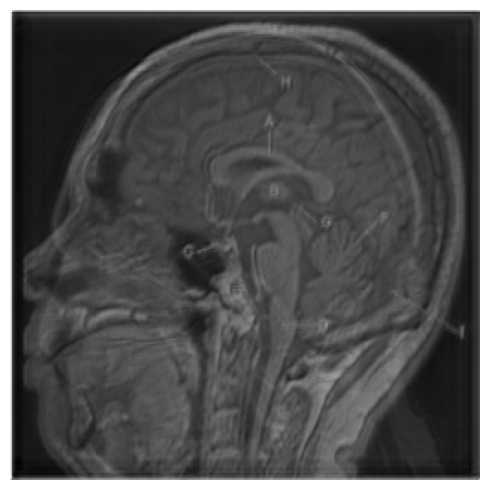

In [ ]:
def run_single_prediction(mri_png_path, dti_png_path, fusion_model):


    def preprocess_png(path, target_shape=(256, 256)):
        img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
        img = img.astype(np.float32) / 255.0
        img = cv2.resize(img, target_shape)
        return img


    mri_img = preprocess_png(mri_png_path)
    dti_img = preprocess_png(dti_png_path)

    mri_input = np.expand_dims(np.expand_dims(mri_img, -1), 0)
    dti_input = np.expand_dims(np.expand_dims(dti_img, -1), 0)
    print("shape of mri image",mri_input.shape)
    print("shape of dti image",dti_input.shape)

    fused = fusion_model.predict([mri_input, dti_input])

    fused_image = fused[0, ..., 0]


    plt.figure(figsize=(15, 5))

    # plt.subplot(1, 3, 1)
    # plt.imshow(mri_img, cmap='gray')
    # plt.title("Input MRI")
    # plt.axis('off')

    # plt.subplot(1, 3, 2)
    # plt.imshow(dti_img, cmap='gray')
    # plt.title("Input DTI")
    # plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(fused_image, cmap='gray')
    #plt.title("Fused Output")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fused_image

# Example usage with your trained model:
mri_png = r"/content/drive/MyDrive/review3/mri_image_1.png"
dti_png = r"/content/drive/MyDrive/review3/dti_image_1.png"
fused_result = run_single_prediction(mri_png, dti_png, fused_model)

In [ ]:
print()

In [ ]:
# Ensure input shape is (1, H, W, 1)
fused = fused_model.predict([mri_array[np.newaxis, ...], dti_array[np.newaxis, ...]])
fused_results.append(fused[0, ..., 0])  # Remove batch and channel dims
import numpy as np
from pathlib import Path
import cv2

# Load and preprocess all MRI/DTI images (batched)
mri_dir = Path("/content/drive/MyDrive/review3/mri_images/")
dti_dir = Path("/content/drive/MyDrive/review3/dti_images/")

mri_files = sorted(mri_dir.glob("*.png"))
dti_files = sorted(dti_dir.glob("*.png"))

def load_images(files):
    images = []
    for file in files:
        img = cv2.imread(str(file), cv2.IMREAD_GRAYSCALE)
        img = img.astype(np.float32) / 255.0  # Normalize
        images.append(img)
    return np.expand_dims(np.array(images), axis=-1)  # Shape: (N, H, W, 1)

mri_array = load_images(mri_files)
dti_array = load_images(dti_files)

# Predict in batches
fused_results = []
fused = fused_model.predict([mri_array, dti_array])  # Input shape (N, H, W, 1)
fused_results.extend(fused[..., 0])  # Remove channel dim

print("Fused results shape:", np.array(fused_results).shape)

ValueError: as_list() is not defined on an unknown TensorShape.

Results

In [ ]:
from pathlib import Path
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from sklearn.metrics import mutual_info_score
from scipy.ndimage import sobel
import numpy as np

### Mutual Information ###
def mutual_information(x, y, bins=256):
    hist_2d, _, _ = np.histogram2d(x.ravel(), y.ravel(), bins=bins)
    return mutual_info_score(None, None, contingency=hist_2d)

### Edge Preservation Index ###
def edge_preservation(source, fused):
    edge_src = sobel(source)
    edge_fused = sobel(fused)
    return np.corrcoef(edge_src.ravel(), edge_fused.ravel())[0, 1]

### Evaluation Pipeline ###
def evaluate_fusion_metrics(mri_path, dti_path, fused_results):
    ssim_scores = []
    psnr_scores = []
    mi_scores = []
    epi_scores = []

    mri_files = sorted(list(Path(mri_path).rglob("*.nii")) + list(Path(mri_path).rglob("*.nii.gz")))[:11]
    dti_files = sorted(list(Path(dti_path).rglob("*.dcm")))[:11]

    mri_images = [preprocess_mri_axial(str(f)) for f in mri_files]
    dti_images = [preprocess_dti(str(f)) for f in dti_files]

    mri_array = np.expand_dims(np.array(mri_images), axis=-1)
    dti_array = np.expand_dims(np.array(dti_images), axis=-1)

    for mri, dti, fused in zip(mri_array[..., 0], dti_array[..., 0], fused_results):
        ssim_scores.append((ssim(fused, mri, data_range=1.0), ssim(fused, dti, data_range=1.0)))
        psnr_scores.append((psnr(fused, mri, data_range=1.0), psnr(fused, dti, data_range=1.0)))
        mi_scores.append((mutual_information(fused, mri), mutual_information(fused, dti)))
        epi_scores.append((edge_preservation(mri, fused), edge_preservation(dti, fused)))

    ssim_scores = np.array(ssim_scores)
    psnr_scores = np.array(psnr_scores)
    mi_scores = np.array(mi_scores)
    epi_scores = np.array(epi_scores)

    print("\n--- Fusion Evaluation Summary ---")
    print(f"SSIM (MRI, DTI): Mean = {ssim_scores.mean(axis=0)}, Std = {ssim_scores.std(axis=0)}")
    print(f"PSNR (MRI, DTI): Mean = {psnr_scores.mean(axis=0)}, Std = {psnr_scores.std(axis=0)}")
    print(f"Mutual Info (MRI, DTI): Mean = {mi_scores.mean(axis=0)}, Std = {mi_scores.std(axis=0)}")
    print(f"Edge Preservation (MRI, DTI): Mean = {epi_scores.mean(axis=0)}, Std = {epi_scores.std(axis=0)}")

    return {
        "SSIM": ssim_scores,
        "PSNR": psnr_scores,
        "MI": mi_scores,
        "EPI": epi_scores
    }

# Paths to your dataset
mri_path = r"/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/"
dti_path = r"/content/drive/MyDrive/DTI/"


# `fused_results` should be a list/array of fused image slices
metrics_results = evaluate_fusion_metrics(mri_path, dti_path, fused_results)



--- Fusion Evaluation Summary ---
SSIM (MRI, DTI): Mean = [0.12687405 0.18668582], Std = [0.02604274 0.02237064]
PSNR (MRI, DTI): Mean = [13.14141565 10.79904573], Std = [1.61022218 0.55439703]
Mutual Info (MRI, DTI): Mean = [0.49918972 0.85162805], Std = [0.03371115 0.06384776]
Edge Preservation (MRI, DTI): Mean = [0.06481015 0.06237229], Std = [0.01568532 0.00866743]


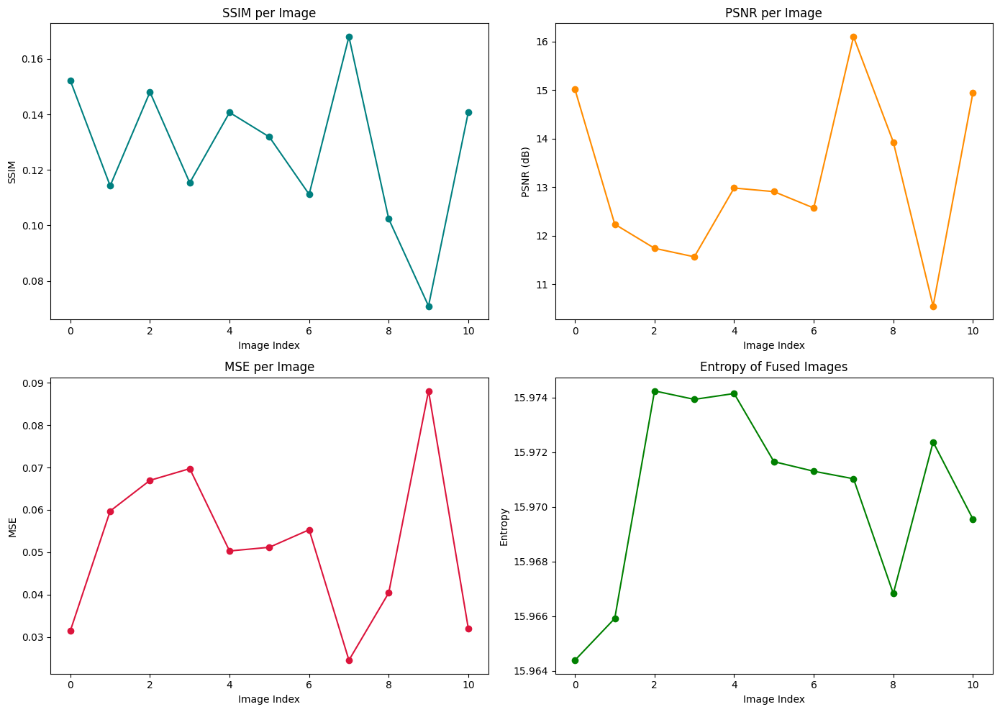

Average SSIM: 0.1269
Average PSNR: 13.14 dB
Average MSE: 0.051801
Average Entropy: 15.9705


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.metrics
from skimage.measure import shannon_entropy
from pathlib import Path

# Load MRI data (first 10 slices)
mri_eval_files = sorted(
    list(Path("/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/").rglob("*.nii")) +
    list(Path("/content/drive/MyDrive/ADNI1_Complete 1Yr 3T/").rglob("*.nii.gz"))
)[:len(fused_results)]

mri_eval = [preprocess_mri_axial(str(f)) for f in mri_eval_files]

# Initialize metric containers
ssim_scores = []
psnr_scores = []
mse_scores = []
entropy_scores = []

# Compute metrics for each fused image vs corresponding MRI slice
for i in range(len(fused_results)):
    mri = mri_eval[i]
    fused = fused_results[i]

    ssim = skimage.metrics.structural_similarity(mri, fused, data_range=1.0)
    psnr = skimage.metrics.peak_signal_noise_ratio(mri, fused, data_range=1.0)
    mse = skimage.metrics.mean_squared_error(mri, fused)
    entropy = shannon_entropy(fused)

    ssim_scores.append(ssim)
    psnr_scores.append(psnr)
    mse_scores.append(mse)
    entropy_scores.append(entropy)

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

axs[0, 0].plot(ssim_scores, marker='o', color='teal')
axs[0, 0].set_title('SSIM per Image')
axs[0, 0].set_xlabel('Image Index')
axs[0, 0].set_ylabel('SSIM')

axs[0, 1].plot(psnr_scores, marker='o', color='darkorange')
axs[0, 1].set_title('PSNR per Image')
axs[0, 1].set_xlabel('Image Index')
axs[0, 1].set_ylabel('PSNR (dB)')

axs[1, 0].plot(mse_scores, marker='o', color='crimson')
axs[1, 0].set_title('MSE per Image')
axs[1, 0].set_xlabel('Image Index')
axs[1, 0].set_ylabel('MSE')

axs[1, 1].plot(entropy_scores, marker='o', color='green')
axs[1, 1].set_title('Entropy of Fused Images')
axs[1, 1].set_xlabel('Image Index')
axs[1, 1].set_ylabel('Entropy')

plt.tight_layout()
plt.show()

# Print mean metric values for summary/report
print(f"Average SSIM: {np.mean(ssim_scores):.4f}")
print(f"Average PSNR: {np.mean(psnr_scores):.2f} dB")
print(f"Average MSE: {np.mean(mse_scores):.6f}")
print(f"Average Entropy: {np.mean(entropy_scores):.4f}")


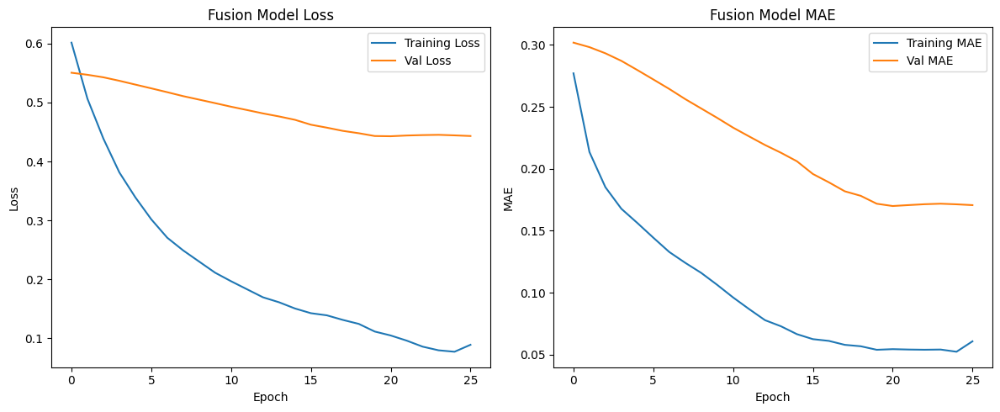

In [ ]:
# Plot loss and MAE over epochs
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Fusion Model Loss")
47
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Val MAE')
plt.title("Fusion Model MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.legend()
plt.tight_layout()
plt.show()